# Gutenberg Text Classification and Topic Modeling

<img src='https://miro.medium.com/max/700/1*ljCBykAJUnvaZcuPYwm4_A.png'>
<br />

In this notebook we will go together into **Gutenberg Books** data to produce classification predictions and compare them; analyze the pros and cons of algorithms and generate and communicate the insights using natural language processing **NLP** techniques<br>



Now we will install important libraries.

# 1. Install important packages 



In [ ]:
! pip install interpret-community

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 129 kB 4.2 MB/s 


In [ ]:
! pip install mlxtend --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached mlxtend-0.20.0-py2.py3-none-any.whl (1.3 MB)
     |████████████████████████████████| 24.8 MB 1.7 MB/s 
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.23.2
    Uninstalling scikit-learn-0.23.2:
      Successfully uninstalled scikit-learn-0.23.2
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.19.0
    Uninstalling mlxtend-0.19.0:
      Successfully uninstalled mlxtend-0.19.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.20.0 which is incompatible.
pycaret 2.3.10 requires scikit-learn==0.23.2, but you have scikit-learn 1.0.2 which is incompatible.


In [ ]:
!pip install nlpaug==1.1.0 transformers==3.0.2 
!pip install snorkel==0.9.8

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 380 kB 4.2 MB/s 
     |████████████████████████████████| 769 kB 52.8 MB/s 
     |████████████████████████████████| 3.0 MB 51.3 MB/s 
     |████████████████████████████████| 1.2 MB 47.1 MB/s 
     |████████████████████████████████| 880 kB 24.1 MB/s 
  Created wheel for sacremoses: filename=sacremoses-0.0.53-py3-none-any.whl size=895260 sha256=002e8e38da41aeb5e29afb5fcf5be7579babdd81c6868f8e5e893734d8b06906
  Stored in directory: /root/.cache/pip/wheels/87/39/dd/a83eeef36d0bf98e7a4d1933a4ad2d660295a40613079bafc9
Successfully built sacremoses
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 103 kB 4.3 MB/s 
  Using cached numpy-1.19.5-cp37-cp37m-manylinux2010_x86_64.whl (14.8 MB)
     |████████████████████████████████| 5.6 MB 23.9 MB/s 
     |█████████████████████

<hr />

# 2. Import Basic libraries

Now we will load libraries that will used in our task

In [ ]:
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

<hr />

# 3. Load dataset

Now we will load our gutenberg dataset

In [ ]:
nltk.download('gutenberg')

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Unzipping corpora/gutenberg.zip.


True

In [ ]:
nltk.corpus.gutenberg.fileids()

['austen-emma.txt',
 'austen-persuasion.txt',
 'austen-sense.txt',
 'bible-kjv.txt',
 'blake-poems.txt',
 'bryant-stories.txt',
 'burgess-busterbrown.txt',
 'carroll-alice.txt',
 'chesterton-ball.txt',
 'chesterton-brown.txt',
 'chesterton-thursday.txt',
 'edgeworth-parents.txt',
 'melville-moby_dick.txt',
 'milton-paradise.txt',
 'shakespeare-caesar.txt',
 'shakespeare-hamlet.txt',
 'shakespeare-macbeth.txt',
 'whitman-leaves.txt']

<hr />

# 4. Select gutenberg books 

Now we will select 5 books from gutenberg dataset for different authors, but have same genres and are semantically the same

In [ ]:
book_1 = ' '.join(nltk.corpus.gutenberg.words('austen-emma.txt'))

In [ ]:
book_2 = ' '.join(nltk.corpus.gutenberg.words('burgess-busterbrown.txt'))

In [ ]:
book_3 = ' '.join(nltk.corpus.gutenberg.words('carroll-alice.txt'))

In [ ]:
book_4 = ' '.join(nltk.corpus.gutenberg.words('edgeworth-parents.txt'))

In [ ]:
book_5 = ' '.join(nltk.corpus.gutenberg.words('bryant-stories.txt'))

In [ ]:
df = pd.DataFrame({'Text':[book_1,book_2,book_3,book_4,book_5],
                   'label':['austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories']})

In [ ]:
df

,Text,label
0,[ Emma by Jane Austen 1816 ] VOLUME I CHAPTER ...,austen-emma
1,[ The Adventures of Buster Bear by Thornton W ...,burgess-busterbrown
2,[ Alice ' s Adventures in Wonderland by Lewis ...,carroll-alice
3,"[ The Parent ' s Assistant , by Maria Edgewort...",edgeworth-parents
4,[ Stories to Tell to Children by Sara Cone Bry...,bryant-stories


<hr />

# 5. Text preprocessing steps

Now we will applay text preprocessing steps

In [ ]:
import re
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
nltk.download('stopwords')
def clean_books(df):
  stemer=PorterStemmer()
  corpus = []
  for i in range(0,len(df)):
    # replace any character with space and leave the from (a - z )
    text = re.sub('[^A-Za-z]',' ',df['Text'][i])
    text = text.lower()
    text = text.split()
    text = [stemer.stem(word) for word in text if word not in set(stopwords.words('english'))]
    text = ' '.join(text)
    corpus.append(text)
  return corpus

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


<hr />

## 5.1 Create corpus that contain cleaned text

In [ ]:
corpus = clean_books(df)

<hr />

## 5.2 Create random sampel from each book

In [ ]:
def samples(book):
  l=[]
  count = 0

  while count <200:
    sample = np.random.choice(book,100)
    l.append(sample)
    count+= 1
  return l 

In [ ]:
#['austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories']
df_final = pd.concat([pd.DataFrame({'Text_sample_':samples(str(corpus[0]).split()),'label':['austen-emma']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[1]).split()),'label':['burgess-busterbrown']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[2]).split()),'label':['carroll-alice']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[3]).split()),'label':['edgeworth-parents']*200}),
                      pd.DataFrame({'Text_sample_':samples(str(corpus[4]).split()),'label':['bryant-stories']*200})],axis=0) 

In [ ]:
df_final.head()

,Text_sample_,label
0,"[letter, morn, weston, superior, elton, occur,...",austen-emma
1,"[mr, mr, sorrow, convinc, destin, think, wish,...",austen-emma
2,"[whisper, induc, extrem, inde, cannot, mount, ...",austen-emma
3,"[due, chang, afraid, born, spoken, dear, churc...",austen-emma
4,"[wish, might, willingli, mr, surpriz, health, ...",austen-emma


In [ ]:
df_final=df_final.reset_index(drop=True)

In [ ]:
df_final['Text_sample'] = df_final['Text_sample_'].apply(lambda x : ' '.join(x))

In [ ]:
df_final.head()

,Text_sample_,label,Text_sample
0,"[letter, morn, weston, superior, elton, occur,...",austen-emma,letter morn weston superior elton occur quit a...
1,"[mr, mr, sorrow, convinc, destin, think, wish,...",austen-emma,mr mr sorrow convinc destin think wish one hap...
2,"[whisper, induc, extrem, inde, cannot, mount, ...",austen-emma,whisper induc extrem inde cannot mount kind of...
3,"[due, chang, afraid, born, spoken, dear, churc...",austen-emma,due chang afraid born spoken dear churchil lit...
4,"[wish, might, willingli, mr, surpriz, health, ...",austen-emma,wish might willingli mr surpriz health tell ma...


In [ ]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Text_sample_  1000 non-null   object
 1   label         1000 non-null   object
 2   Text_sample   1000 non-null   object
dtypes: object(3)
memory usage: 23.6+ KB


In [ ]:
df_final.to_csv('data.csv')

In [ ]:
emma = df_final['Text_sample'][df_final['label']=='austen-emma']

<hr />

# 6. Analysis and gain insights

Now we will analysis and gain insights upon our preproceesing data.
we will use A frequency distribution to gain insights upon the frequency of each word type in a our document.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
<FreqDist with 89 samples and 101 outcomes>
----------------------------
[('elton', 3), ('emma', 2)]


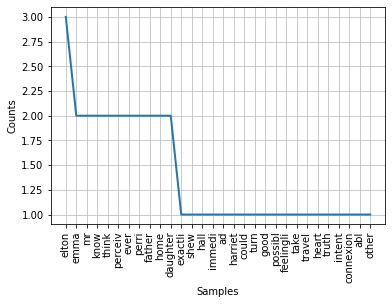

In [ ]:
from nltk.probability import FreqDist
nltk.download('punkt')

fdist = FreqDist(nltk.word_tokenize(df_final['Text_sample'][df_final['label']=='austen-emma'][10]))
print(fdist)
print("----------------------------")
print(fdist.most_common(2))

fdist.plot(30,cumulative=False)
plt.show()

<FreqDist with 78 samples and 100 outcomes>
----------------------------
[('one', 4), ('buster', 4)]


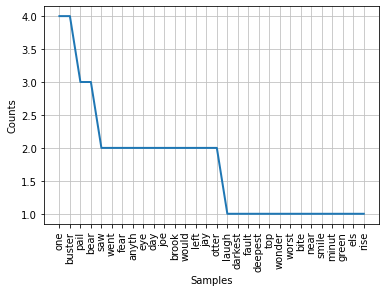

In [ ]:
fdist = FreqDist(nltk.word_tokenize(df_final['Text_sample'][df_final['label']=='burgess-busterbrown'][250]))
print(fdist)
print("----------------------------")
print(fdist.most_common(2))

fdist.plot(30,cumulative=False)
plt.show()

<hr />

## 6.1 Word Cloud

<img src='https://theappassembly.com/wp-content/uploads/2016/11/BigDataWordMap-1264x736.jpg'>

<br />

Now let's draw a wordcloud fo each book.

wordcloud consider a visual representations of words that give greater prominence to words that appear more frequently in doucument

In [ ]:
from wordcloud import WordCloud, STOPWORDS
def worldcloud(df):
  comment_words = ''
  stopwords = set(STOPWORDS)
  
  # iterate through the csv file
  for val in df:
      
      # typecaste each val to string
      val = str(val)
  
      # split the value
      tokens = val.split()
      
      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()
      
      comment_words += " ".join(tokens)+" "
  
  wordcloud = WordCloud(width = 800, height = 800,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)
  
  # plot the WordCloud image                      
  plt.figure(figsize = (8, 8), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)
  
  plt.show()

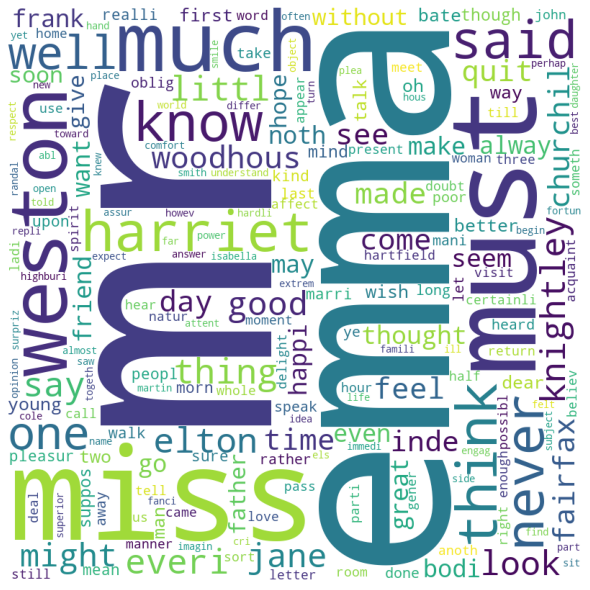

In [ ]:
worldcloud(emma)

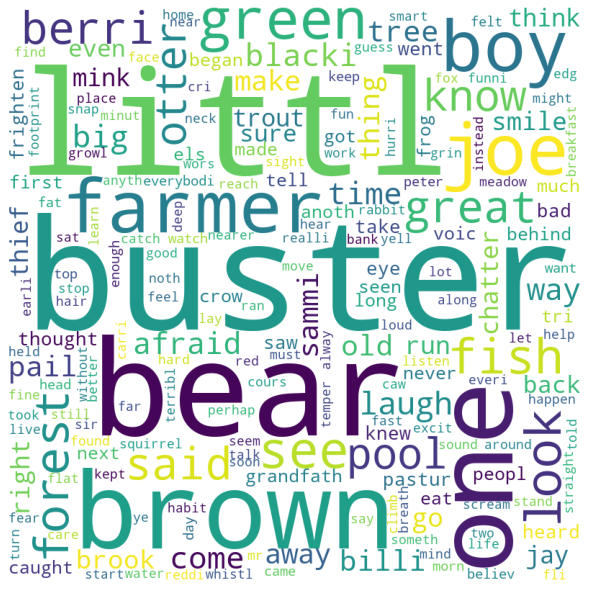

In [ ]:
# 'austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories'
busterbrown = df_final['Text_sample'][df_final['label']=='burgess-busterbrown']
worldcloud(busterbrown)

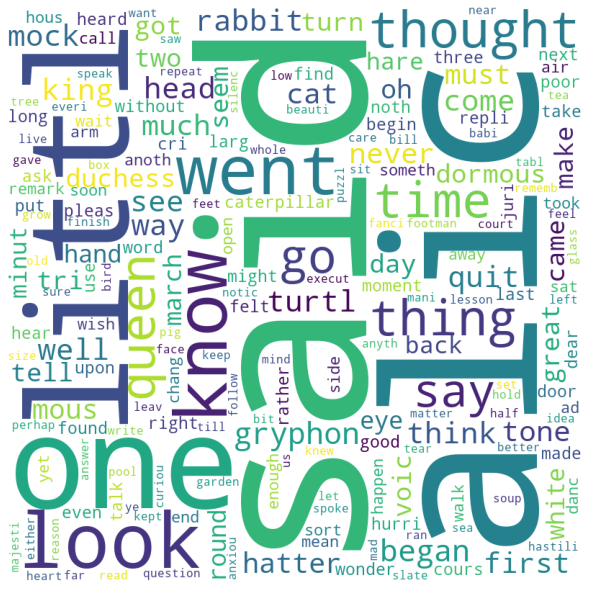

In [ ]:
carroll_alice = df_final['Text_sample'][df_final['label']=='carroll-alice']
worldcloud(carroll_alice)

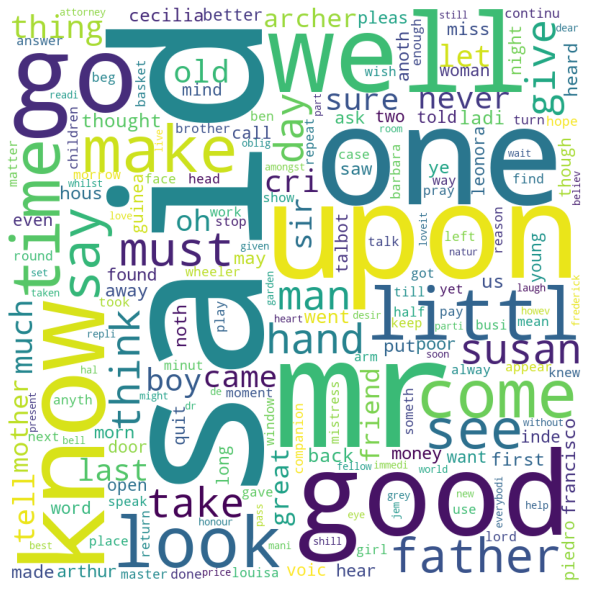

In [ ]:
edgeworth_parents = df_final['Text_sample'][df_final['label']=='edgeworth-parents']
worldcloud(edgeworth_parents)

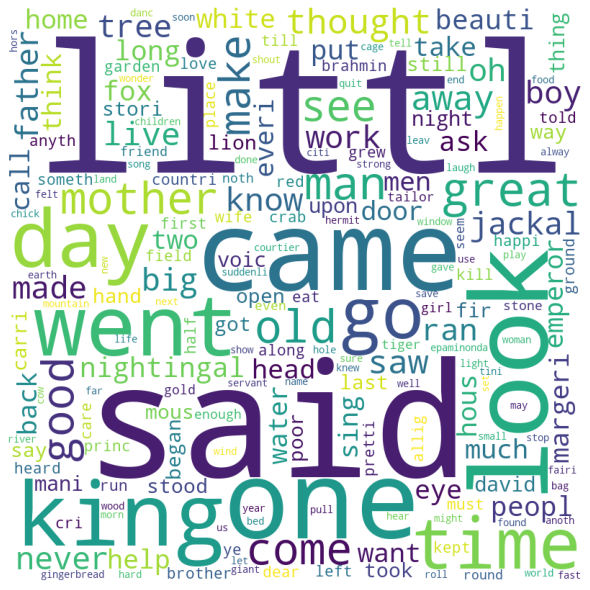

In [ ]:
bryant_stories = df_final['Text_sample'][df_final['label']=='bryant-stories']
worldcloud(bryant_stories)

In [ ]:
# 'austen-emma','burgess-busterbrown','carroll-alice','edgeworth-parents','bryant-stories'
encode = {'austen-emma' : 0 , 'burgess-busterbrown' : 1, 'carroll-alice': 2, 'edgeworth-parents' : 3, 'bryant-stories' :4}
df_final['label'] = df_final['label'].map(encode)

In [ ]:
X = df_final['Text_sample'].values
y = df_final['label']

In [ ]:
X

array(['letter morn weston superior elton occur quit aim rate finish seen well attest soon mr world mile crown mistaken took might come mere three look grown cold smile give remembr happi ration harriet length thought bate immedi thought rais bore old walk throughout best woodhous think two help hope day much visit confid look favourit ask mr like settl determin save size valu cannot indignantli agre might hind horseback enough perfectli meet would engag elton run children extraordinari resolv invit fair busi bates wrote equal one though talk thing deal inherit visit think eas never inconveni shew begin must forget',
       'mr mr sorrow convinc destin think wish one happi enjoy gener age go inde know differ ad doubt could cri anxieti where small see error ought mother john flight complet fail perhap felt age desert littl beyond liberti said opportun children know indiffer told see housekeep pleas speak say let fine mr prepar mind drawn lose refus behind ever reason see figur soon perh

<hr />

# 7. Data preparation

Now we will prepare our data to be ready to feed into machine learning models

## 7.1 Create Bag of Words

<img src='https://www.novuslight.com/uploads/n/BagofWords.jpg'>

<br />

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
bow = CountVectorizer()
X_bow = bow.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_bow,columns=bow.get_feature_names())

,ab,abash,abat,abbey,abdi,abid,abil,abl,abolit,abroad,...,york,yorkshir,young,younger,youngster,youth,zeal,zealand,zelia,zigzag
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
998,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<hr />

## 7.2 Split dataset

Now we will split our dataset into training and testing sets

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train , y_test = train_test_split(X_bow, y, test_size=0.2 , random_state=42, stratify = y)

<hr />

## 7.3 Prediction of Error

This is the main function for predicting mean squared error, bias and variance for models.

In [ ]:
from mlxtend.evaluate import bias_variance_decomp
from sklearn import preprocessing
def PredictionError(Model_X_train, Model_X_test, Model_Y_train, Model_Y_test, Model_Y_Prediction,model):
  ErrorsList = []
  TrueList = []
  PredictionList = []
  TestLabel = np.array(Model_Y_test)

  for i, z in enumerate(x_test):
    if Model_Y_Prediction[i] != TestLabel[i]:
      err = z
      ErrorsList.append(err)

      correctLabel = TestLabel[i]
      TrueList.append(correctLabel)

      prediction = Model_Y_Prediction[i]
      PredictionList.append(prediction)
  
  
  data_frame = pd.DataFrame()
  data_frame['doc_error'] = ErrorsList
  data_frame['correct']   = TrueList
  data_frame['Predicted'] = PredictionList

  #label_encoder object knows how to understand word labels. 
  Label_Encoding = preprocessing.LabelEncoder()
  CopyOfXTrain = np.copy(Model_X_train)
  CopyOfXTest = np.copy(Model_X_test)
  CopyOfYTrain = np.copy(Model_Y_train)
  CopyOfYTest = np.copy(Model_Y_test)

  MSE, Bias, Variance = bias_variance_decomp(model, 
                                            np.array(CopyOfXTrain)  , 
                                            Label_Encoding.fit_transform(CopyOfYTrain)  ,
                                            np.array(CopyOfXTest)  , 
                                            Label_Encoding.fit_transform(CopyOfYTest),
                                            num_rounds=2,
                                            random_seed=123)
  
  print('THE BIAS IS : %.3f' % Bias)
  print('THE VARIANCE IS : %.3f' % Variance)

  

<hr />

## 7.4 Using Naive Bayes model

In [ ]:
from sklearn.naive_bayes import MultinomialNB
nb = MultinomialNB()
nb.fit(x_train,y_train)

MultinomialNB()

In [ ]:
y_pred=nb.predict(x_test)

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test,y_pred)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_train,nb.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800



In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
# PredictionError(Model_X_train, Model_X_test, Model_Y_train, Model_Y_test, Model_Y_Prediction,model)
PredictionError(x_train,x_test,y_train,y_test,y_pred,nb.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


<hr />

## 7.5 Using Passive Aggressive Classifier model

In [ ]:
from sklearn.linear_model import PassiveAggressiveClassifier
pc = PassiveAggressiveClassifier()
pc.fit(x_train,y_train)

PassiveAggressiveClassifier()

In [ ]:
y_pred_pc=pc.predict(x_test)
cm = confusion_matrix(y_test,y_pred_pc)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,pc.predict(x_train)))
print(classification_report(y_test,y_pred_pc))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,pc.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


<hr />

## 7.6 Using Decision Tree Classifier model

In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_pred_dt=dt.predict(x_test)
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[38,  0,  0,  2,  0],
       [ 0, 39,  0,  0,  1],
       [ 0,  0, 38,  1,  1],
       [ 1,  0,  0, 34,  5],
       [ 0,  0,  0,  2, 38]])

In [ ]:
print(classification_report(y_train,dt.predict(x_train)))
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.97      0.95      0.96        40
           1       1.00      0.97      0.99        40
           2       1.00      0.95      0.97        40
           3       0.87      0.85      0.86        40
           4       0.84      0.95      0.89        40

    accuracy                           0.94       200
   macro avg       0.94      0.93      0.94       200
weighted avg       0.94      0.94      0.94       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,dt.fit(x_train,y_train))

THE BIAS IS : 0.060
THE VARIANCE IS : 0.052


In [ ]:
from sklearn.svm import SVC
svm = SVC()
svm.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svm=svm.predict(x_test)
cm = confusion_matrix(y_test,y_pred_svm)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,svm.predict(x_train)))
print(classification_report(y_test,y_pred_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,svm.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(x_train,y_train)

KNeighborsClassifier()

<hr />

## 7.7 Using KNN model

In [ ]:
y_pred_knn=knn.predict(x_test)
cm = confusion_matrix(y_test,y_pred_knn)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 1,  0,  1, 38,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,knn.predict(x_train)))
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       0.99      0.99      0.99       160
           4       0.99      0.99      0.99       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        40
           1       1.00      1.00      1.00        40
           2       0.98      1.00      0.99        40
           3       1.00      0.95      0.97        40
           4       1.00      1.00      1.00        40

    accuracy                           0.99       200
   macro avg       0.99      0.99      0.99       200
weighted avg       0.99      0.99      0.99       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,knn.fit(x_train,y_train))

THE BIAS IS : 0.020
THE VARIANCE IS : 0.015


<hr />

# 8. Ten-Fold Cross-Validation for all models

## 8.1 Cross-Validation using Naive Bayes model

In [ ]:
from sklearn.model_selection import cross_val_score
nb_cv = MultinomialNB()
scores_nb = cross_val_score(nb_cv, x_train, y_train, cv=10)
scores_nb

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

<hr />

## 8.2 Cross-Validation using Passive Aggressive Classifier model

In [ ]:
pc_cv = PassiveAggressiveClassifier()
scores_pc = cross_val_score(pc_cv, x_train, y_train, cv=10)
scores_pc

array([1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 0.9875,
       1.    , 1.    ])

<hr />

## 8.3 Cross-Validation using Decision Tree Classifier model

In [ ]:
dt_cv = DecisionTreeClassifier()
scores_dt = cross_val_score(dt_cv, x_train, y_train, cv=10)
scores_dt

array([0.9625, 0.9875, 0.9125, 0.925 , 0.9625, 0.975 , 0.9   , 0.9375,
       0.925 , 0.9375])

<hr />

## 8.4 Cross-Validation using Support Vector Classifier model

In [ ]:
svm_cv = SVC()
scores_svm = cross_val_score(svm_cv, x_train, y_train, cv=10)
scores_svm

array([1.    , 1.    , 0.9875, 1.    , 1.    , 1.    , 1.    , 0.9875,
       1.    , 1.    ])

<hr />

## 8.5 Cross-Validation using KNeighbors Classifier model

In [ ]:
knn_cv = KNeighborsClassifier()
scores_knn = cross_val_score(knn_cv, x_train, y_train, cv=10)
scores_knn

array([0.975 , 1.    , 1.    , 1.    , 1.    , 0.9875, 1.    , 0.975 ,
       1.    , 0.9875])

<hr />


# 9. Apply the last same steps but with less feature

In [ ]:
bow= CountVectorizer(max_features= 2000)
X_bow_2000 = bow.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_bow_2000,columns=bow.get_feature_names())

,abbey,abl,absenc,absolut,accept,accid,accord,account,acknowledg,acorn,...,yawn,ye,year,yell,yellow,yesterday,yet,young,youth,zelia
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
996,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
997,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
998,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [ ]:
x_train, x_test, y_train , y_test = train_test_split(X_bow_2000, y, test_size=0.2 , random_state=42, stratify = y)

In [ ]:
nb_2000 = MultinomialNB()
nb_2000.fit(x_train,y_train)

MultinomialNB()

In [ ]:
y_pred=nb_2000.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_test,y_pred))
print(classification_report(y_train,nb_2000.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,nb_2000.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
pc_2000 = PassiveAggressiveClassifier()
pc_2000.fit(x_train,y_train)

PassiveAggressiveClassifier()

In [ ]:
y_pred_pc=pc_2000.predict(x_test)
cm = confusion_matrix(y_test,y_pred_pc)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,pc_2000.predict(x_train)))
print(classification_report(y_test,y_pred_pc))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,pc_2000.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
dt_2000 = DecisionTreeClassifier()
dt_2000.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_pred_dt=dt_2000.predict(x_test)
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[38,  0,  0,  2,  0],
       [ 0, 39,  0,  0,  1],
       [ 0,  0, 38,  1,  1],
       [ 0,  0,  0, 38,  2],
       [ 0,  0,  0,  1, 39]])

In [ ]:
print(classification_report(y_train,dt_2000.predict(x_train)))
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        40
           1       1.00      0.97      0.99        40
           2       1.00      0.95      0.97        40
           3       0.90      0.95      0.93        40
           4       0.91      0.97      0.94        40

    accuracy                           0.96       200
   macro avg       0.96      0.96      0.96       200
weighted avg       0.96      0.96      0.96       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,dt_2000.fit(x_train,y_train))

THE BIAS IS : 0.045
THE VARIANCE IS : 0.060


In [ ]:
svm_2000 = SVC()
svm_2000.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svm=svm_2000.predict(x_test)
cm = confusion_matrix(y_test,y_pred_svm)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,svm_2000.predict(x_train)))
print(classification_report(y_test,y_pred_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,svm_2000.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
knn_2000 = KNeighborsClassifier()
knn_2000.fit(x_train,y_train)

KNeighborsClassifier()

In [ ]:
y_pred_knn=knn_2000.predict(x_test)
cm = confusion_matrix(y_test,y_pred_knn)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  1, 39]])

In [ ]:
print(classification_report(y_train,knn_2000.predict(x_train)))
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      0.99      1.00       160
           3       0.95      0.99      0.97       160
           4       0.99      0.96      0.97       160

    accuracy                           0.99       800
   macro avg       0.99      0.99      0.99       800
weighted avg       0.99      0.99      0.99       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       0.98      1.00      0.99        40
           4       1.00      0.97      0.99        40

    accuracy                           0.99       200
   macro avg       1.00      0.99      0.99       200
weighted avg       1.00      0.99      0.99       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,knn_2000.fit(x_train,y_train))

THE BIAS IS : 0.035
THE VARIANCE IS : 0.028


<hr />


# 10. Apply cross validation on 2000 feature

In [ ]:
nb_cv_2000 = MultinomialNB()
scores_nb = cross_val_score(nb_cv_2000, x_train, y_train, cv=10)
scores_nb

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
pc_cv_2000 = PassiveAggressiveClassifier()
scores_pc = cross_val_score(pc_cv_2000, x_train, y_train, cv=10)
scores_pc

array([1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 0.9875,
       1.    , 1.    ])

In [ ]:
dt_cv_2000 = DecisionTreeClassifier()
scores_dt = cross_val_score(dt_cv_2000, x_train, y_train, cv=10)
scores_dt

array([0.9625, 0.95  , 0.9125, 0.9375, 0.9625, 0.975 , 0.9125, 0.95  ,
       0.975 , 0.9125])

In [ ]:
svm_cv_2000 = SVC()
scores_svm = cross_val_score(svm_cv_2000, x_train, y_train, cv=10)
scores_svm

array([1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 1.    , 0.9875,
       1.    , 1.    ])

In [ ]:
knn_cv_2000 = KNeighborsClassifier()
scores_knn = cross_val_score(knn_cv_2000, x_train, y_train, cv=10)
scores_knn

array([0.9625, 0.9875, 0.95  , 0.975 , 0.9625, 0.95  , 0.9875, 0.975 ,
       1.    , 0.975 ])

<hr />


# 11. Apply TF-IDF

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

tf = TfidfVectorizer()
X_tf=tf.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_tf,columns=tf.get_feature_names())

,ab,abash,abat,abbey,abdi,abid,abil,abl,abolit,abroad,...,york,yorkshir,young,younger,youngster,youth,zeal,zealand,zelia,zigzag
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.071558,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
x_train, x_test, y_train , y_test = train_test_split(X_tf, y, test_size=0.2 , random_state=42, stratify = y)

In [ ]:
nb_tf = MultinomialNB()
nb_tf.fit(x_train,y_train)

MultinomialNB()

In [ ]:
y_pred=nb_tf.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,nb_tf.predict(x_train)))
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,nb_tf.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
pc_tf = PassiveAggressiveClassifier()
pc_tf.fit(x_train,y_train)

PassiveAggressiveClassifier()

In [ ]:
y_pred_pc=pc_tf.predict(x_test)
cm = confusion_matrix(y_test,y_pred_pc)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,pc_tf.predict(x_train)))
print(classification_report(y_test,y_pred_pc))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,pc_tf.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
dt_tf = DecisionTreeClassifier()
dt_tf.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_pred_dt=dt_tf.predict(x_test)
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[35,  0,  0,  1,  4],
       [ 0, 39,  0,  0,  1],
       [ 0,  0, 38,  0,  2],
       [ 2,  0,  2, 32,  4],
       [ 0,  0,  0,  3, 37]])

In [ ]:
print(classification_report(y_train,dt_tf.predict(x_train)))
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.95      0.88      0.91        40
           1       1.00      0.97      0.99        40
           2       0.95      0.95      0.95        40
           3       0.89      0.80      0.84        40
           4       0.77      0.93      0.84        40

    accuracy                           0.91       200
   macro avg       0.91      0.90      0.91       200
weighted avg       0.91      0.91      0.91       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,dt_tf.fit(x_train,y_train))

THE BIAS IS : 0.085
THE VARIANCE IS : 0.072


In [ ]:
svm_tf = SVC()
svm_tf.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svm=svm_tf.predict(x_test)
cm = confusion_matrix(y_test,y_pred_svm)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 0,  0,  0, 40,  0],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,svm_tf.predict(x_train)))
print(classification_report(y_test,y_pred_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      1.00      1.00        40
           4       1.00      1.00      1.00        40

    accuracy                           1.00       200
   macro avg       1.00      1.00      1.00       200
weighted avg       1.00      1.00      1.00       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,svm_tf.fit(x_train,y_train))

THE BIAS IS : 0.000
THE VARIANCE IS : 0.000


In [ ]:
knn_tf = KNeighborsClassifier()
knn_tf.fit(x_train,y_train)

KNeighborsClassifier()

In [ ]:
y_pred_knn=knn_tf.predict(x_test)
cm = confusion_matrix(y_test,y_pred_knn)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 1,  0,  0, 38,  1],
       [ 0,  0,  0,  0, 40]])

In [ ]:
print(classification_report(y_train,knn_tf.predict(x_train)))
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       0.99      1.00      1.00       160
           4       1.00      0.99      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        40
           1       1.00      1.00      1.00        40
           2       1.00      1.00      1.00        40
           3       1.00      0.95      0.97        40
           4       0.98      1.00      0.99        40

    accuracy                           0.99       200
   macro avg       0.99      0.99      0.99       200
weighted avg       0.99      0.99      0.99       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,knn_tf.fit(x_train,y_train))

THE BIAS IS : 0.025
THE VARIANCE IS : 0.010


In [ ]:
nb_cv_tf = MultinomialNB()
scores_nb = cross_val_score(nb_cv_tf, x_train, y_train, cv=10)
scores_nb

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
pc_cv_tf = PassiveAggressiveClassifier()
scores_pc = cross_val_score(pc_cv_tf, x_train, y_train, cv=10)
scores_pc

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
dt_cv_tf = DecisionTreeClassifier()
scores_dt = cross_val_score(dt_cv_tf, x_train, y_train, cv=10)
scores_dt

array([0.9375, 0.9625, 0.9   , 0.9125, 0.95  , 0.9125, 0.9   , 0.9625,
       0.9375, 0.9625])

In [ ]:
svm_cv_tf = SVC()
scores_svm = cross_val_score(svm_cv_tf, x_train, y_train, cv=10)
scores_svm

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
knn_cv_tf = KNeighborsClassifier()
scores_knn = cross_val_score(knn_cv_tf, x_train, y_train, cv=10)
scores_knn

array([0.9875, 0.9875, 0.9875, 1.    , 1.    , 0.975 , 0.9875, 0.9625,
       1.    , 0.9875])

<hr />

#12. Apply tf idf with bigram

## Hint: The accuracy of the model decreased after applying Bigram as feature engineering method

In [ ]:
tf = TfidfVectorizer(ngram_range=(2,2))
X_tf_bi=tf.fit_transform(X).toarray()

In [ ]:
pd.DataFrame(X_tf_bi,columns=tf.get_feature_names())

,ab busi,abash beg,abat would,abbey anoth,abbey busi,abbey chair,abbey come,abbey entangl,abbey fairfax,abbey falsehood,...,zelia philistin,zelia said,zelia sing,zelia sugar,zelia tailor,zelia thief,zelia warm,zigzag could,zigzag twelv,zigzag whistl
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
x_train, x_test, y_train , y_test = train_test_split(X_tf_bi, y, test_size=0.2 , random_state=42, stratify = y)

In [ ]:
nb_tf_bi = MultinomialNB()
nb_tf_bi.fit(x_train,y_train)

MultinomialNB()

In [ ]:
y_pred=nb_tf_bi.predict(x_test)
cm = confusion_matrix(y_test,y_pred)
cm

array([[36,  1,  2,  0,  1],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [ 6,  7, 12, 11,  4],
       [ 0,  6,  6,  2, 26]])

In [ ]:
print(classification_report(y_train,nb_tf_bi.predict(x_train)))
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.86      0.90      0.88        40
           1       0.74      1.00      0.85        40
           2       0.67      1.00      0.80        40
           3       0.85      0.28      0.42        40
           4       0.84      0.65      0.73        40

    accuracy                           0.77       200
   macro avg       0.79      0.76      0.74       200
weighted avg       0.79      0.77      0.74       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,nb_tf_bi.fit(x_train,y_train))

THE BIAS IS : 0.475
THE VARIANCE IS : 0.398


In [ ]:
pc_tf_bi = PassiveAggressiveClassifier()
pc_tf_bi.fit(x_train,y_train)

PassiveAggressiveClassifier()

In [ ]:
y_pred_pc=pc_tf_bi.predict(x_test)
cm = confusion_matrix(y_test,y_pred_pc)
cm

array([[40,  0,  0,  0,  0],
       [ 0, 40,  0,  0,  0],
       [ 0,  0, 40,  0,  0],
       [13,  2,  4, 17,  4],
       [ 0,  4,  6,  4, 26]])

In [ ]:
print(classification_report(y_train,pc_tf_bi.predict(x_train)))
print(classification_report(y_test,y_pred_pc))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.75      1.00      0.86        40
           1       0.87      1.00      0.93        40
           2       0.80      1.00      0.89        40
           3       0.81      0.42      0.56        40
           4       0.87      0.65      0.74        40

    accuracy                           0.81       200
   macro avg       0.82      0.82      0.80       200
weighted avg       0.82      0.81      0.80       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,pc_tf_bi.fit(x_train,y_train))

THE BIAS IS : 0.240
THE VARIANCE IS : 0.113


In [ ]:
dt_tf_bi = DecisionTreeClassifier()
dt_tf_bi.fit(x_train,y_train)

DecisionTreeClassifier()

In [ ]:
y_pred_dt=dt_tf_bi.predict(x_test)
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[ 9,  0,  0, 29,  2],
       [ 1, 25,  1, 10,  3],
       [ 2,  0, 18, 16,  4],
       [ 0,  1,  1, 35,  3],
       [ 0,  3,  1, 26, 10]])

In [ ]:
print(classification_report(y_train,dt_tf_bi.predict(x_train)))
print(classification_report(y_test,y_pred_dt))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       0.75      0.23      0.35        40
           1       0.86      0.62      0.72        40
           2       0.86      0.45      0.59        40
           3       0.30      0.88      0.45        40
           4       0.45      0.25      0.32        40

    accuracy                           0.48       200
   macro avg       0.65      0.48      0.49       200
weighted avg       0.65      0.48      0.49       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,dt_tf_bi.fit(x_train,y_train))

THE BIAS IS : 0.560
THE VARIANCE IS : 0.185


In [ ]:
svm_tf_bi = SVC()
svm_tf_bi.fit(x_train,y_train)

SVC()

In [ ]:
y_pred_svm=svm_tf_bi.predict(x_test)
cm = confusion_matrix(y_test,y_pred_svm)
cm

array([[23,  0,  0, 17,  0],
       [ 0, 18,  0, 16,  6],
       [ 0,  0, 15, 21,  4],
       [ 0,  0,  0, 37,  3],
       [ 0,  0,  0, 14, 26]])

In [ ]:
print(classification_report(y_train,svm_tf_bi.predict(x_train)))
print(classification_report(y_test,y_pred_svm))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       160
           1       1.00      1.00      1.00       160
           2       1.00      1.00      1.00       160
           3       1.00      1.00      1.00       160
           4       1.00      1.00      1.00       160

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

              precision    recall  f1-score   support

           0       1.00      0.57      0.73        40
           1       1.00      0.45      0.62        40
           2       1.00      0.38      0.55        40
           3       0.35      0.93      0.51        40
           4       0.67      0.65      0.66        40

    accuracy                           0.59       200
   macro avg       0.80      0.59      0.61       200
weighted avg       0.80      0.59      0.61       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,svm_tf_bi.fit(x_train,y_train))

THE BIAS IS : 0.645
THE VARIANCE IS : 0.492


In [ ]:
knn_tf_bi = KNeighborsClassifier()
knn_tf_bi.fit(x_train,y_train)

KNeighborsClassifier()

In [ ]:
y_pred_knn=knn_tf_bi.predict(x_test)
cm = confusion_matrix(y_test,y_pred_knn)
cm

array([[23,  4,  8,  2,  3],
       [ 0, 40,  0,  0,  0],
       [ 0,  1, 39,  0,  0],
       [11,  9,  6, 10,  4],
       [ 0, 15,  7,  0, 18]])

In [ ]:
print(classification_report(y_train,knn_tf_bi.predict(x_train)))
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       0.85      0.84      0.85       160
           1       0.63      1.00      0.77       160
           2       0.68      0.95      0.79       160
           3       0.89      0.41      0.56       160
           4       0.88      0.49      0.63       160

    accuracy                           0.74       800
   macro avg       0.79      0.74      0.72       800
weighted avg       0.79      0.74      0.72       800

              precision    recall  f1-score   support

           0       0.68      0.57      0.62        40
           1       0.58      1.00      0.73        40
           2       0.65      0.97      0.78        40
           3       0.83      0.25      0.38        40
           4       0.72      0.45      0.55        40

    accuracy                           0.65       200
   macro avg       0.69      0.65      0.61       200
weighted avg       0.69      0.65      0.61       200



In [ ]:
PredictionError(x_train,x_test,y_train,y_test,y_pred,knn_tf_bi.fit(x_train,y_train))

THE BIAS IS : 0.435
THE VARIANCE IS : 0.228


<hr />

# 13. Apply cross validation on bigram tfidf

In [ ]:
nb_cv_tf_bi = MultinomialNB()
scores_nb = cross_val_score(nb_cv_tf_bi, x_train, y_train, cv=10)
scores_nb

array([0.825 , 0.7625, 0.7875, 0.725 , 0.775 , 0.775 , 0.775 , 0.775 ,
       0.7375, 0.75  ])

In [ ]:
pc_cv_tf_bi = PassiveAggressiveClassifier()
scores_pc = cross_val_score(pc_cv_tf_bi, x_train, y_train, cv=10)
scores_pc

array([0.85  , 0.8625, 0.8125, 0.8   , 0.8375, 0.8   , 0.8125, 0.85  ,
       0.8   , 0.8125])

In [ ]:
dt_cv_tf_bi = DecisionTreeClassifier()
scores_dt = cross_val_score(dt_cv_tf_bi, x_train, y_train, cv=10)
scores_dt

array([0.55  , 0.4875, 0.4125, 0.3875, 0.4875, 0.5125, 0.4875, 0.425 ,
       0.45  , 0.4625])

In [ ]:
svm_cv_tf_bi = SVC()
scores_svm = cross_val_score(svm_cv_tf_bi, x_train, y_train, cv=10)
scores_svm

array([0.6375, 0.675 , 0.5625, 0.6125, 0.5   , 0.65  , 0.725 , 0.5875,
       0.5625, 0.55  ])

In [ ]:
knn_cv_tf_bi = KNeighborsClassifier()
scores_knn = cross_val_score(knn_cv_tf_bi, x_train, y_train, cv=10)
scores_knn

array([0.6625, 0.6875, 0.6   , 0.6875, 0.6125, 0.6625, 0.65  , 0.65  ,
       0.6   , 0.5875])

<hr />

# 14. LDA

# IMPORTANT HINT
**when you reached to this part you should restart the notebook and start running it from this part agin because their is packages dependency error** 

In [ ]:
! pip install pycaret[full]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Jinja2-2.11.3-py2.py3-none-any.whl (125 kB)
  Using cached numpy-1.19.5-cp37-cp37m-manylinux2010_x86_64.whl (14.8 MB)
  Attempting uninstall: Jinja2
    Found existing installation: Jinja2 3.1.2
    Uninstalling Jinja2-3.1.2:
      Successfully uninstalled Jinja2-3.1.2
  Attempting uninstall: numpy
    Found existing installation: numpy 1.20.0
    Uninstalling numpy-1.20.0:
      Successfully uninstalled numpy-1.20.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0+zzzcolab20220506162203 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
xarray-einstats 0.2.2 requires numpy>=1.21, but you have numpy 1.19.5 which is incompatible.
tensorflow 2.8.0+zzzcolab20220506162203 requires numpy>=1.20, but you have numpy 

In [ ]:
! pip uninstall numpy --yes

Found existing installation: numpy 1.19.5
Uninstalling numpy-1.19.5:
  Successfully uninstalled numpy-1.19.5


In [ ]:
! pip install numpy==1.20.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached numpy-1.20.0-cp37-cp37m-manylinux2010_x86_64.whl (15.3 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0+zzzcolab20220506162203 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.
yellowbrick 1.3.post1 requires numpy<1.20,>=1.16.0, but you have numpy 1.20.0 which is incompatible.
xarray-einstats 0.2.2 requires numpy>=1.21, but you have numpy 1.20.0 which is incompatible.
tensorflow 2.8.0+zzzcolab20220506162203 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.6.0 which is incompatible.
snorkel 0.9.8 requires numpy<1.20.0,>=1.16.5, but you have numpy 1.20.0 which is incompatible.
google-colab 1.0.0 requires ipykernel~=4.10, but you have ipykernel 6.13.0 which is incompatible.
google-colab 1.0.0 requ

In [ ]:
! pip uninstall Jinja2 --yes

Found existing installation: Jinja2 2.11.3
Uninstalling Jinja2-2.11.3:
  Successfully uninstalled Jinja2-2.11.3


In [ ]:
! pip install Jinja2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Jinja2-3.1.2-py3-none-any.whl (133 kB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires ipykernel~=4.10, but you have ipykernel 6.13.0 which is incompatible.
google-colab 1.0.0 requires ipython~=5.5.0, but you have ipython 7.34.0 which is incompatible.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.27.1 which is incompatible.
google-colab 1.0.0 requires tornado~=5.1.0; python_version >= "3.0", but you have tornado 6.1 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import pandas as pd

df_final = pd.read_csv('data.csv',index_col = 0)
df_final.head()

,Text_sample_,label,Text_sample
0,['letter' 'morn' 'weston' 'superior' 'elton' '...,austen-emma,letter morn weston superior elton occur quit a...
1,['mr' 'mr' 'sorrow' 'convinc' 'destin' 'think'...,austen-emma,mr mr sorrow convinc destin think wish one hap...
2,['whisper' 'induc' 'extrem' 'inde' 'cannot' 'm...,austen-emma,whisper induc extrem inde cannot mount kind of...
3,['due' 'chang' 'afraid' 'born' 'spoken' 'dear'...,austen-emma,due chang afraid born spoken dear churchil lit...
4,['wish' 'might' 'willingli' 'mr' 'surpriz' 'he...,austen-emma,wish might willingli mr surpriz health tell ma...


In [ ]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
from pycaret.nlp import *

In [ ]:
df_final.head()

,Text_sample_,label,Text_sample
0,['letter' 'morn' 'weston' 'superior' 'elton' '...,austen-emma,letter morn weston superior elton occur quit a...
1,['mr' 'mr' 'sorrow' 'convinc' 'destin' 'think'...,austen-emma,mr mr sorrow convinc destin think wish one hap...
2,['whisper' 'induc' 'extrem' 'inde' 'cannot' 'm...,austen-emma,whisper induc extrem inde cannot mount kind of...
3,['due' 'chang' 'afraid' 'born' 'spoken' 'dear'...,austen-emma,due chang afraid born spoken dear churchil lit...
4,['wish' 'might' 'willingli' 'mr' 'surpriz' 'he...,austen-emma,wish might willingli mr surpriz health tell ma...


In [ ]:
lda = setup(data = df_final, target = 'Text_sample', session_id=123) 

Description,Value
session_id,123
Documents,1000
Vocab Size,3825
Custom Stopwords,False


<hr />

## 14.1 Create LDA using 5 topics

In [ ]:
m1 = create_model(model='lda',num_topics = 5, multi_core=True)

In [ ]:
lda_data = assign_model(m1) 

In [ ]:
lda_data.head()

,Text_sample_,label,Text_sample,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Dominant_Topic,Perc_Dominant_Topic
0,['letter' 'morn' 'weston' 'superior' 'elton' '...,austen-emma,occur aim rate finish see well attest soon tak...,0.513481,0.475802,0.003572,0.003570,0.003575,Topic 0,0.51
1,['mr' 'mr' 'sorrow' 'convinc' 'destin' 'think'...,austen-emma,think wish happi enjoy gener age go know diffe...,0.736969,0.254367,0.002879,0.002877,0.002908,Topic 0,0.74
2,['whisper' 'induc' 'extrem' 'inde' 'cannot' 'm...,austen-emma,induc mount kind offer may unabl astonish nigh...,0.678623,0.309150,0.004062,0.004087,0.004078,Topic 0,0.68
3,['due' 'chang' 'afraid' 'born' 'spoken' 'dear'...,austen-emma,due bear speak littl present spare could forlo...,0.651861,0.284273,0.004267,0.055312,0.004287,Topic 0,0.65
4,['wish' 'might' 'willingli' 'mr' 'surpriz' 'he...,austen-emma,may willingli tell make letter passion find fl...,0.988845,0.002764,0.002781,0.002799,0.002811,Topic 0,0.99


In [ ]:
lda_data.Dominant_Topic	.value_counts()

Topic 0    476
Topic 1    243
Topic 3    101
Topic 2     99
Topic 4     81
Name: Dominant_Topic, dtype: int64

<hr />

## 14.2 Plot top 100 words in our topics

In [ ]:
plot_model(m1, plot = 'frequency')

<hr />

## 14.3 Plot sentiment polarity distribution

In [ ]:
plot_model(m1, plot = 'sentiment')

<hr />

## 14.5 Evaluate LDA model

In [ ]:
evaluate_model(m1)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [ ]:
lda_data = lda_data.drop(['Text_sample_','Dominant_Topic','Perc_Dominant_Topic','Text_sample'],axis=1)

In [ ]:
from pycaret.classification import *

# **HINT** You must press ENTER button to finish cell run

In [ ]:
#You must press ENTER button to finish cell run
model = setup(data = lda_data, target = 'label', session_id = 123)

,Description,Value
0,session_id,123
1,Target,label
2,Target Type,Multiclass
3,Label Encoded,"austen-emma: 0, bryant-stories: 1, burgess-bus..."
4,Original Data,"(1000, 6)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


<hr />

## 14.6 Compare different models

In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8326,0.9598,0.8392,0.8401,0.8316,0.7905,0.7928,0.700
rf,Random Forest Classifier,0.8298,0.9599,0.8360,0.8318,0.8280,0.7869,0.7883,0.512
et,Extra Trees Classifier,0.8298,0.9558,0.8361,0.8324,0.8283,0.7869,0.7884,0.463
knn,K Neighbors Classifier,0.8269,0.9441,0.8339,0.8307,0.8246,0.7833,0.7854,0.120
catboost,CatBoost Classifier,0.8240,0.9603,0.8318,0.8291,0.8213,0.7798,0.7823,7.015
qda,Quadratic Discriminant Analysis,0.8183,0.9408,0.8242,0.8192,0.8125,0.7723,0.7757,0.018
xgboost,Extreme Gradient Boosting,0.8183,0.9561,0.8255,0.8267,0.8170,0.7725,0.7754,0.538
nb,Naive Bayes,0.8126,0.9341,0.8188,0.8147,0.8065,0.7652,0.7690,0.017
lightgbm,Light Gradient Boosting Machine,0.8069,0.9572,0.8143,0.8178,0.8069,0.7582,0.7611,0.448
lr,Logistic Regression,0.8040,0.9553,0.8100,0.8123,0.7922,0.7543,0.7628,0.463


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8714,0.9643,0.8752,0.8714,0.8679,0.8392,0.8409
1,0.7571,0.9485,0.7695,0.7588,0.7566,0.6961,0.6967
2,0.8000,0.9565,0.8076,0.8087,0.7994,0.7495,0.7518
3,0.8000,0.9414,0.8065,0.7993,0.7987,0.7497,0.7501
4,0.8429,0.9776,0.8484,0.8517,0.8392,0.8036,0.8079
5,0.8714,0.9664,0.8750,0.8726,0.8706,0.8390,0.8396
6,0.8857,0.9838,0.8882,0.8897,0.8866,0.8570,0.8577
7,0.8286,0.9577,0.8293,0.8262,0.8259,0.7852,0.7860
8,0.7857,0.9384,0.7950,0.7807,0.7797,0.7313,0.7332


<hr />

# 15. Visualizations

## 15.1 ROC curve

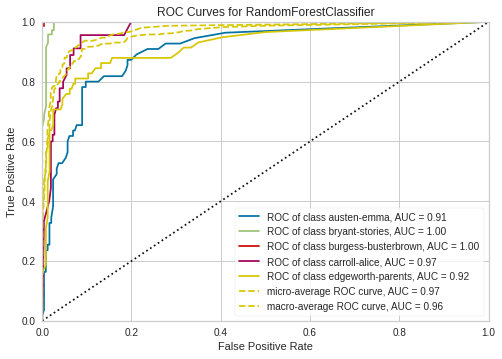

In [ ]:
plot_model(rf, plot = 'auc')

<hr />

## 15.2 Precision-Recall curve

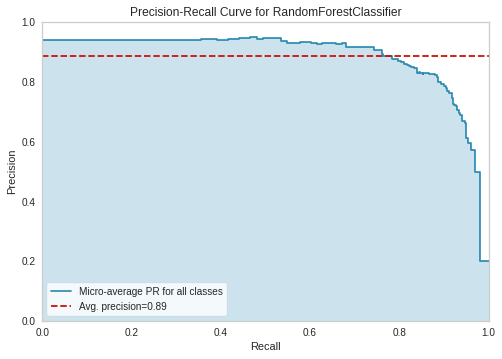

In [ ]:
plot_model(rf, plot = 'pr')

<hr />

## 15.3 Confusion Matrix

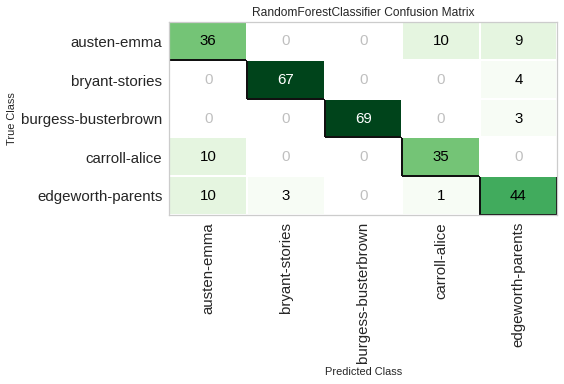

In [ ]:
plot_model(rf, plot = 'confusion_matrix')

<hr />

## 15.4 Class prediction error for Random Forest Classifier

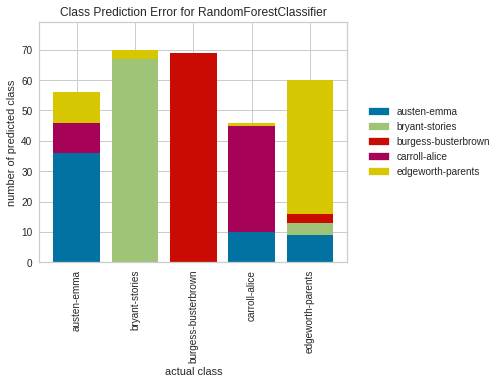

In [ ]:
plot_model(rf, plot = 'error')

<hr />

## 15.6 Decision Boundary

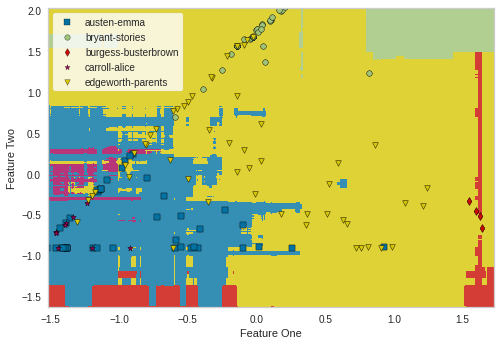

In [ ]:
plot_model(rf, plot = 'boundary')

In [ ]:
evaluate_model(rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

<hr />

# 16. Error Analysis of champion model LDA + RandomForest

## 16.1 Model interpretion using Permutation Feature Importance plot

In [ ]:
interpret_model(rf, plot = 'pfi') # Permutation Feature Importance

5it [00:00,  8.90it/s]


<hr />

## 16.2 Model interpretion using summary plot

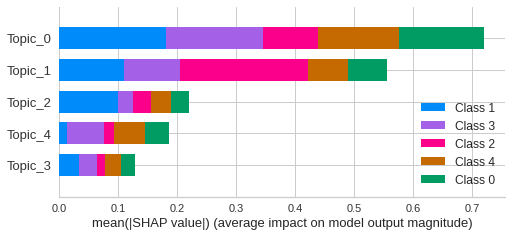

In [ ]:
interpret_model(rf)


<hr />

## 16.3 Model interpretion using reason plot

In [ ]:
interpret_model(rf,plot= 'reason')


<hr />

## 16.4 Model interpretion using Morris Sensitivity Analysis plot

In [ ]:
interpret_model(rf, plot = 'msa') #Morris Sensitivity Analysis

<hr />

## 16.5 Model interpretion using Partial dependence plots

In [ ]:
interpret_model(rf, plot = 'pdp') #Partial dependence plots. Partial dependence plots (PDP) show the dependence between the target response and a set of input features of interest, marginalizing over the values of all other input features

<hr />

# 17. Data Augmantation

In [ ]:
df_final.head()

,Text_sample_,label,Text_sample
0,['letter' 'morn' 'weston' 'superior' 'elton' '...,austen-emma,letter morn weston superior elton occur quit a...
1,['mr' 'mr' 'sorrow' 'convinc' 'destin' 'think'...,austen-emma,mr mr sorrow convinc destin think wish one hap...
2,['whisper' 'induc' 'extrem' 'inde' 'cannot' 'm...,austen-emma,whisper induc extrem inde cannot mount kind of...
3,['due' 'chang' 'afraid' 'born' 'spoken' 'dear'...,austen-emma,due chang afraid born spoken dear churchil lit...
4,['wish' 'might' 'willingli' 'mr' 'surpriz' 'he...,austen-emma,wish might willingli mr surpriz health tell ma...


In [ ]:
import nlpaug.augmenter.word as naw
substitution = naw.ContextualWordEmbsAug(model_path="distilbert-base-uncased", action="substitute")
insertion = naw.ContextualWordEmbsAug(model_path="distilbert-base-uncased", action="insert")

Downloading:   0%|          | 0.00/442 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/268M [00:00<?, ?B/s]

In [ ]:
corpus = []
for i in range(len(df_final['Text_sample'])):
  augmented_text = insertion.augment(str(df_final['Text_sample'][i]))
  corpus.append(augmented_text)
df = pd.DataFrame(corpus)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:846: RuntimeWarning: invalid value encountered in double_scalars
  mcc = cov_ytyp / np.sqrt(cov_ytyt * cov_ypyp)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:101: FutureWarning: The outputs_2d_ attribute is deprecated in version 0.22 and will be removed in version 0.24. It is equivalent to n_outputs_ > 1.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_pr

In [ ]:
df.to_csv('augmentation.csv')

In [ ]:
df = pd.read_csv('augmentation.csv',index_col=0)
df.head()

,0
0,letter morn weston superior elton occur quit a...
1,mr mr sorrow convinc destin think wish one hap...
2,funeral whisper induc extrem inde cannot mount...
3,due chang afraid born spoken dear churchil lit...
4,wish might willingli mr surpriz health tell ma...


In [ ]:
from pycaret.nlp import *
lda_aug = setup(data = df, target = '0',session_id=123) 

Description,Value
session_id,123
Documents,1000
Vocab Size,4199
Custom Stopwords,False


In [ ]:
m_aug = create_model(model='lda',num_topics = 5, multi_core=True)

In [ ]:
lda_data = assign_model(m_aug) 

In [ ]:
plot_model(m_aug, plot = 'frequency')

In [ ]:
plot_model(m_aug, plot = 'sentiment')

In [ ]:
evaluate_model(m_aug)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Frequency Plot', 'freque…

In [ ]:
lda_data

,0,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Dominant_Topic,Perc_Dominant_Topic
0,occur aim rate finish see well attest soon cro...,0.987179,0.003210,0.003211,0.003183,0.003217,Topic 0,0.99
1,think wish happi enjoy gener age go know diffe...,0.989775,0.002573,0.002554,0.002550,0.002548,Topic 0,0.99
2,funeral whisper induc mount kind offer may una...,0.652296,0.003498,0.003504,0.003500,0.337202,Topic 0,0.65
3,due bear speak littl present spare could fall ...,0.829483,0.003513,0.003533,0.003504,0.159967,Topic 0,0.83
4,may willingli tell make letter passion find ha...,0.664893,0.327797,0.002440,0.002432,0.002439,Topic 0,0.66
...,...,...,...,...,...,...,...,...
995,see fall could portrait head shelf true sat he...,0.002797,0.002812,0.118451,0.101509,0.774432,Topic 4,0.77
996,work suddenli ask go close littl fine next lou...,0.002945,0.604021,0.002974,0.104364,0.285696,Topic 1,0.60
997,would rope warrior far money grind call show b...,0.002808,0.002805,0.096268,0.491090,0.407029,Topic 3,0.49
998,wretch man bright bit roll wealth littl happen...,0.002361,0.002368,0.154556,0.002374,0.838341,Topic 4,0.84


In [ ]:
lda_data = lda_data.drop(['0','Perc_Dominant_Topic'],axis=1)

# **HINT** You must press ENTER button to finish cell run

In [ ]:
from pycaret.classification import *
model = setup(data = lda_data, target = 'Dominant_Topic', session_id = 123) 

,Description,Value
0,session_id,123
1,Target,Dominant_Topic
2,Target Type,Multiclass
3,Label Encoded,"Topic 0: 0, Topic 1: 1, Topic 2: 2, Topic 3: 3..."
4,Original Data,"(1000, 6)"
5,Missing Values,False
6,Numeric Features,5
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9986,1.0000,0.9900,0.9987,0.9983,0.9980,0.9980,0.491
gbc,Gradient Boosting Classifier,0.9957,1.0000,0.9870,0.9963,0.9956,0.9941,0.9942,0.698
xgboost,Extreme Gradient Boosting,0.9957,1.0000,0.9880,0.9964,0.9956,0.9941,0.9942,0.389
lightgbm,Light Gradient Boosting Machine,0.9943,1.0000,0.9875,0.9945,0.9941,0.9922,0.9923,0.286
et,Extra Trees Classifier,0.9929,0.9999,0.9854,0.9933,0.9926,0.9902,0.9903,0.460
catboost,CatBoost Classifier,0.9928,0.9999,0.9769,0.9937,0.9925,0.9902,0.9903,6.807
ridge,Ridge Classifier,0.9914,0.0000,0.9844,0.9922,0.9913,0.9882,0.9884,0.014
svm,SVM - Linear Kernel,0.9900,0.0000,0.9920,0.9912,0.9901,0.9863,0.9865,0.063
lda,Linear Discriminant Analysis,0.9886,0.9996,0.9897,0.9909,0.9891,0.9844,0.9847,0.017
dt,Decision Tree Classifier,0.9885,0.9929,0.9732,0.9897,0.9886,0.9843,0.9844,0.017


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
1,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
2,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
3,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
4,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
6,1.0000,0.9997,1.00,1.0000,1.0000,1.0000,1.0000
7,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.00,1.0000,1.0000,1.0000,1.0000


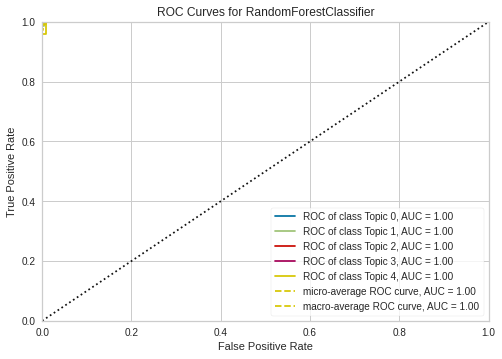

In [ ]:
plot_model(rf, plot = 'auc')

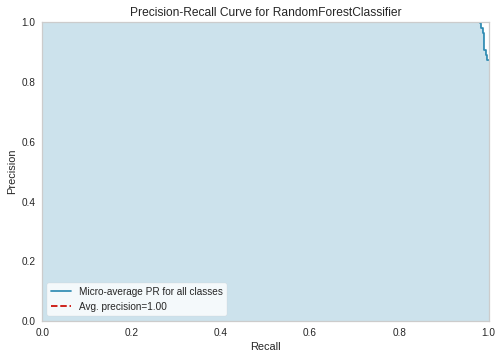

In [ ]:
plot_model(rf, plot = 'pr')

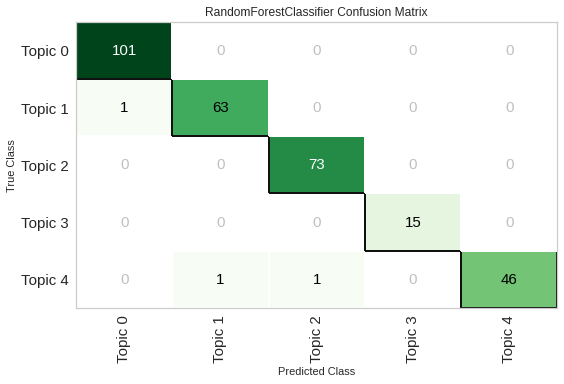

In [ ]:
plot_model(rf, plot = 'confusion_matrix')

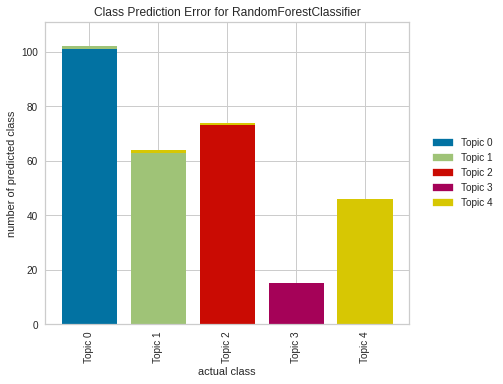

In [ ]:
plot_model(rf, plot = 'error')

In [ ]:
evaluate_model(rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

<hr />

# 18. Error Analysis of champion model LDA + RandomForest with augmantation

In [ ]:
interpret_model(rf, plot = 'pfi') # Permutation Feature Importance

5it [00:00,  8.94it/s]


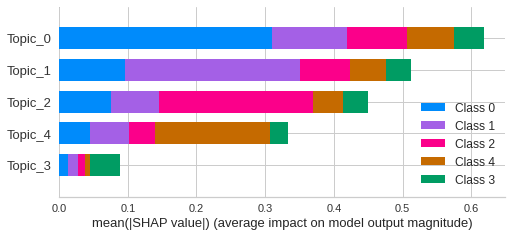

In [ ]:
interpret_model(rf)

In [ ]:
interpret_model(rf,plot= 'reason')

In [ ]:
interpret_model(rf, plot = 'msa')#Morris Sensitivity Analysis

In [ ]:
interpret_model(rf, plot = 'pdp')# Partial dependence plots. Partial dependence plots (PDP) show the dependence between the target response and a set of input features of interest, marginalizing over the values of all other input features

# Important Hint

Models performance will be changed for each code run because changing of data for each time because we pick random text for each run